In [2]:
import pandas as pd
import os

In [3]:
! pip install -q kaggle

In [4]:
from google.colab import files

#Upload file kaggle.JSON

In [5]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rafaz1","key":"2b120dbf410265793df8e366fe40ea53"}'}

#Membuat Direktori Kaggle

In [6]:
! mkdir ~/.kaggle

mkdir: cannot create directory ‘/root/.kaggle’: File exists


Mencopy file kaggle.json ke direktori kaggle

In [7]:
! cp kaggle.json ~/.kaggle/

mengganti permission kaggle file

In [8]:
! chmod 600 ~/.kaggle/kaggle.json

menampilkan dataset yang dapat didownload dari kaggle

In [9]:
! kaggle datasets list

ref                                                               title                                                 size  lastUpdated          downloadCount  
----------------------------------------------------------------  --------------------------------------------------  ------  -------------------  -------------  
christianlillelund/donald-trumps-rallies                          Donald Trump's Rallies                               720KB  2020-09-26 10:25:08            706  
heeraldedhia/groceries-dataset                                    Groceries dataset                                    257KB  2020-09-17 04:36:08           3331  
andrewmvd/trip-advisor-hotel-reviews                              Trip Advisor Hotel Reviews                             5MB  2020-09-30 08:31:20           1903  
balraj98/stanford-background-dataset                              Stanford Background Dataset                           17MB  2020-09-26 12:57:59            199  
nehaprabhavalkar/india

#Download skin-cancer-mnist-ham10000.zip

In [10]:
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

100% 5.20G/5.20G [01:48<00:00, 30.8MB/s]
100% 5.20G/5.20G [01:48<00:00, 51.6MB/s]


In [11]:
! mkdir skin_cancer_mnist

In [12]:
! unzip skin-cancer-mnist-ham10000.zip -d skin_cancer_mnist

Streaming output truncated to the last 5000 lines.
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029326.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029327.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029328.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029329.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029330.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029331.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029332.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029333.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029334.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029335.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029336.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029337.jpg  
  inflating: skin_cancer_mnist/ham10000_images_part_2/ISIC_0029338.jpg  


menghapus folder ham10000_images_part_1 dan part_2 karena tidak diperlukan

In [13]:
!rm -r /content/skin_cancer_mnist/ham10000_images_part_1

In [14]:
!rm -r /content/skin_cancer_mnist/ham10000_images_part_2

#Import Library

In [15]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns
from PIL import Image
np.random.seed(123)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
import itertools

import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools
from keras.layers.normalization import BatchNormalization
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from sklearn.model_selection import train_test_split

In [16]:
def plot_model_history(model_history):
    fig, axs = plt.subplots(1,2,figsize=(15,5))
    # summarize history for accuracy
    axs[0].plot(range(1,len(model_history.history['accuracy'])+1),model_history.history['accuracy'])
    axs[0].plot(range(1,len(model_history.history['val_accuracy'])+1),model_history.history['val_accuracy'])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.arange(1,len(model_history.history['accuracy'])+1),len(model_history.history['accuracy'])/10)
    axs[0].legend(['train', 'val'], loc='best')
    # summarize history for loss
    axs[1].plot(range(1,len(model_history.history['loss'])+1),model_history.history['loss'])
    axs[1].plot(range(1,len(model_history.history['val_loss'])+1),model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.arange(1,len(model_history.history['loss'])+1),len(model_history.history['loss'])/10)
    axs[1].legend(['train', 'val'], loc='best')
    plt.show()

#Load image dan membuat dictionary

In [17]:
file_dir = os.path.join('..', '/content/skin_cancer_mnist')

# Merging images from both folders HAM10000_images_part1.zip and HAM10000_images_part2.zip into one dictionary

imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(file_dir, '*', '*.jpg'))}

# This dictionary is useful for displaying more human-friendly labels later on

lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [18]:
skin_df = pd.read_csv(os.path.join(file_dir, 'HAM10000_metadata.csv'))

# Creating New Columns for better readability

skin_df['path'] = skin_df['image_id'].map(imageid_path_dict.get)
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df['cell_type_idx'] = pd.Categorical(skin_df['cell_type']).codes

#Data Cleansing

In [19]:
skin_df.head(100)

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
...,...,...,...,...,...,...,...,...,...,...
95,HAM_0000746,ISIC_0027023,bkl,histo,60.0,male,face,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
96,HAM_0001473,ISIC_0029022,bkl,histo,70.0,male,face,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
97,HAM_0003007,ISIC_0025388,bkl,histo,40.0,female,abdomen,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2
98,HAM_0003007,ISIC_0028080,bkl,histo,40.0,female,abdomen,/content/skin_cancer_mnist/HAM10000_images_par...,Benign keratosis-like lesions,2


In [20]:
skin_df.isnull().sum()

lesion_id         0
image_id          0
dx                0
dx_type           0
age              57
sex               0
localization      0
path              0
cell_type         0
cell_type_idx     0
dtype: int64

In [21]:
skin_df['age'].fillna((skin_df['age'].mean()), inplace=True)

In [22]:
skin_df.isnull().sum()

lesion_id        0
image_id         0
dx               0
dx_type          0
age              0
sex              0
localization     0
path             0
cell_type        0
cell_type_idx    0
dtype: int64

In [23]:
skin_df['image'] = skin_df['path'].map(lambda x: np.asarray(Image.open(x).resize((100,75))))

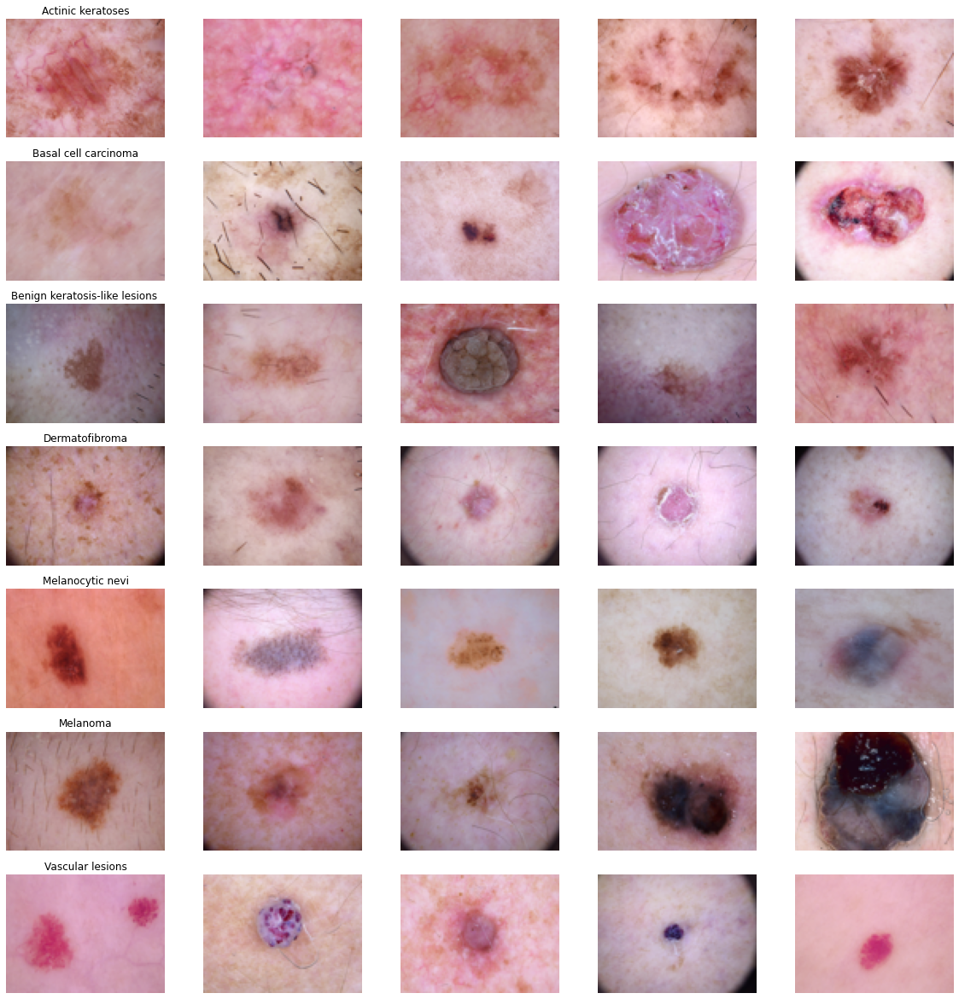

In [24]:
n_samples = 5
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

In [25]:
skin_df['image'].map(lambda x: x.shape).value_counts()

(75, 100, 3)    10015
Name: image, dtype: int64

#Feature Engineering

In [26]:
features=skin_df.drop(columns=['cell_type_idx'],axis=1)
target=skin_df['cell_type_idx']

In [27]:
x_train_o, x_test_o, y_train_o, y_test_o = train_test_split(features, target, test_size=0.20,random_state=1234)

In [28]:
x_train = np.asarray(x_train_o['image'].tolist())
x_test = np.asarray(x_test_o['image'].tolist())

x_train_mean = np.mean(x_train)
x_train_std = np.std(x_train)

x_test_mean = np.mean(x_test)
x_test_std = np.std(x_test)

x_train = (x_train - x_train_mean)/x_train_std
x_test = (x_test - x_test_mean)/x_test_std

In [29]:
y_train = to_categorical(y_train_o, num_classes = 7)
y_test = to_categorical(y_test_o, num_classes = 7)

In [30]:
print(y_train)

[[0. 0. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 1. 0. 0.]]


In [31]:
x_train, x_validate, y_train, y_validate = train_test_split(x_train, y_train, test_size = 0.20, random_state = 10)

In [32]:
x_train = x_train.reshape(x_train.shape[0], *(75, 100, 3))
x_test = x_test.reshape(x_test.shape[0], *(75, 100, 3))
x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

In [33]:
x_train.shape

(6409, 75, 100, 3)

In [34]:
print(x_train)

[[[[-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   ...
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]]

  [[-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   ...
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]]

  [[-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   ...
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]
   [-3.44173005e+00 -3.44173005e+00 -3.44173005e+00]]

  ...

  [[-3.44173

#CNN

In [35]:
input_shape = (75, 100, 3)
num_classes = 7

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',padding = 'Same',input_shape=input_shape)) #1
model.add(Conv2D(32,kernel_size=(3, 3), activation='relu',padding = 'Same',)) #2
model.add(MaxPool2D(pool_size = (2, 2))) #3
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same')) #4
model.add(Conv2D(64, (3, 3), activation='relu',padding = 'Same')) #5
model.add(MaxPool2D(pool_size=(2, 2))) #6
model.add(Dropout(0.40))

model.add(Flatten())
model.add(Dense(128, activation='relu')) #7
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax')) #8
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 75, 100, 32)       896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 75, 100, 32)       9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 37, 50, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 37, 50, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 37, 50, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 37, 50, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 18, 25, 64)        0

In [36]:
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

In [37]:
model.compile(optimizer = optimizer , loss = "categorical_crossentropy", metrics=["accuracy"])

In [38]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)

#Image Augmentation With ImageDataGenerator

In [39]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.1,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.1,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=False,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [40]:
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot

untuk:  Random Horizontal Shift


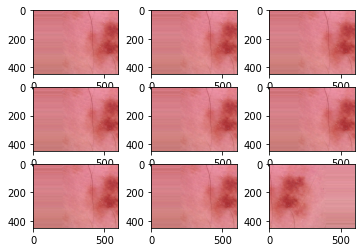

untuk:  Random Vertical Shift


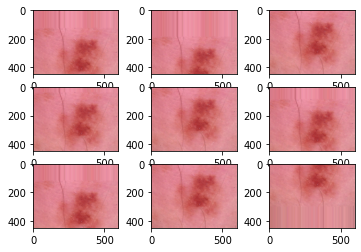

untuk:  Random horizontal Flip


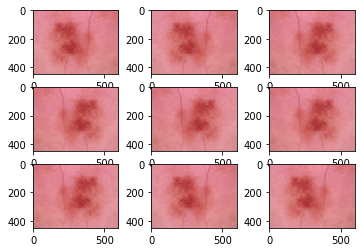

untuk:  Random Rotation Augmentation


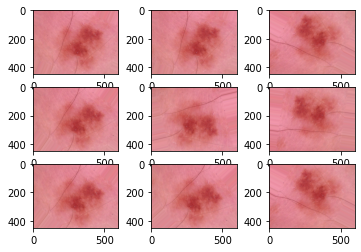

untuk:  Random Brightness Augmentation


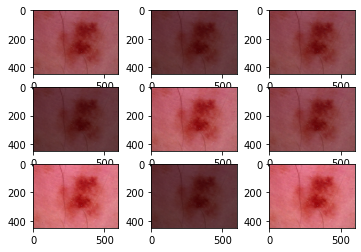

untuk:  Random Zoom Augmentation


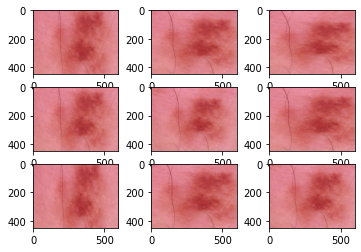

In [41]:
def parameter(prm):
  img = load_img('/content/skin_cancer_mnist/HAM10000_images_part_1/ISIC_0024307.jpg')
  data = img_to_array(img)
  samples = expand_dims(data, 0)
  datagen2 = (prm)
  it = datagen2.flow(samples, batch_size=1)
  for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
  pyplot.show()
param=[ImageDataGenerator(width_shift_range=[-200,200]),ImageDataGenerator(height_shift_range=0.5),ImageDataGenerator(horizontal_flip=True),ImageDataGenerator(rotation_range=90),ImageDataGenerator(brightness_range=[0.2,1.0]),ImageDataGenerator(zoom_range=[0.5,1.0])]
name=['Random Horizontal Shift','Random Vertical Shift','Random horizontal Flip','Random Rotation Augmentation','Random Brightness Augmentation','Random Zoom Augmentation']

for i in range(len(name)):
  print('untuk: ',name[i])
  parameter(param[i])

#Checkpoint

In [42]:
from tensorflow.keras.callbacks import ModelCheckpoint

In [43]:
filepath='skin.h5'
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

#Tensorboard

In [44]:
from tensorflow.keras.callbacks import TensorBoard
import os
import datetime

In [45]:
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Tempat dimana log tensorboard akan di
callbacks_list.append(TensorBoard(logdir, histogram_freq=1))

In [46]:
epochs = 100 
batch_size = 256
history = model.fit_generator(datagen.flow(x_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = (x_validate,y_validate),
                              verbose = 1, steps_per_epoch=x_train.shape[0] // batch_size
                              , callbacks=callbacks_list)

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 2.0134 - accuracy: 0.1211WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
25/25 [==============================] - ETA: 0s - loss: 1.4123 - accuracy: 0.6216
Epoch 00001: val_accuracy improved from -inf to 0.68185, saving model to skin.h5
25/25 [==============================] - 12s 469ms/step - loss: 1.4123 - accuracy: 0.6216 - val_loss: 1.0417 - val_accuracy: 0.6818
Epoch 2/100
24/25 [===========================>..] - ETA: 0s - loss: 1.0205 - accuracy: 0.6642
Epoch 00002: val_accuracy improved from 0.68185 to 0.68559, saving model to skin.h5
25/25 [==============================] - 11s 440ms/step - loss: 1.0220 - accu

In [47]:
%load_ext tensorboard

In [48]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [49]:
model_filename = "skin.h5"

model.load_weights(model_filename)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

#Visualisasi Feature terhadap Layer CNN

In [50]:
from keras.models import Model
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(x_train[10].reshape(1,75,100,3))
 
def display_activation(activations, col_size, row_size, act_index): 
    activation = activations[act_index]
    activation_index=0
    fig, ax = plt.subplots(row_size, col_size, figsize=(row_size*2.5,col_size*1.5))
    for row in range(0,row_size):
        for col in range(0,col_size):
            ax[row][col].imshow(activation[0, :, :, activation_index], cmap=None)
            activation_index += 1
        


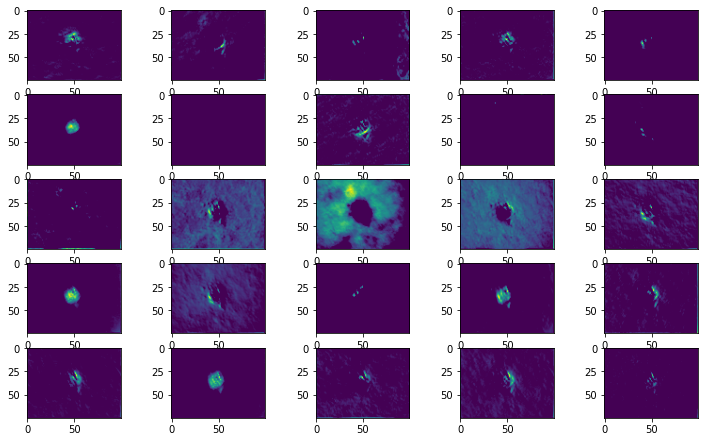

In [51]:
display_activation(activations, 5, 5, 0)

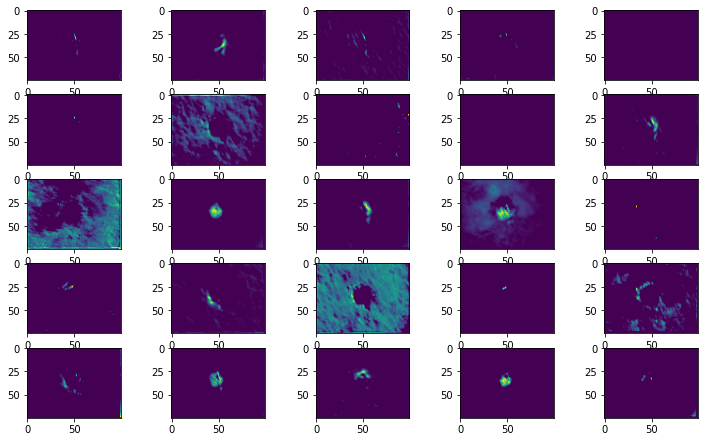

In [52]:
display_activation(activations, 5, 5, 1)

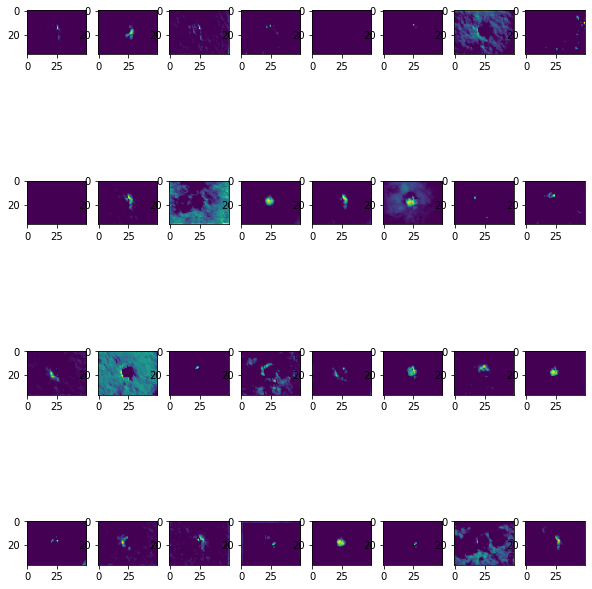

In [53]:
display_activation(activations, 8, 4, 3)

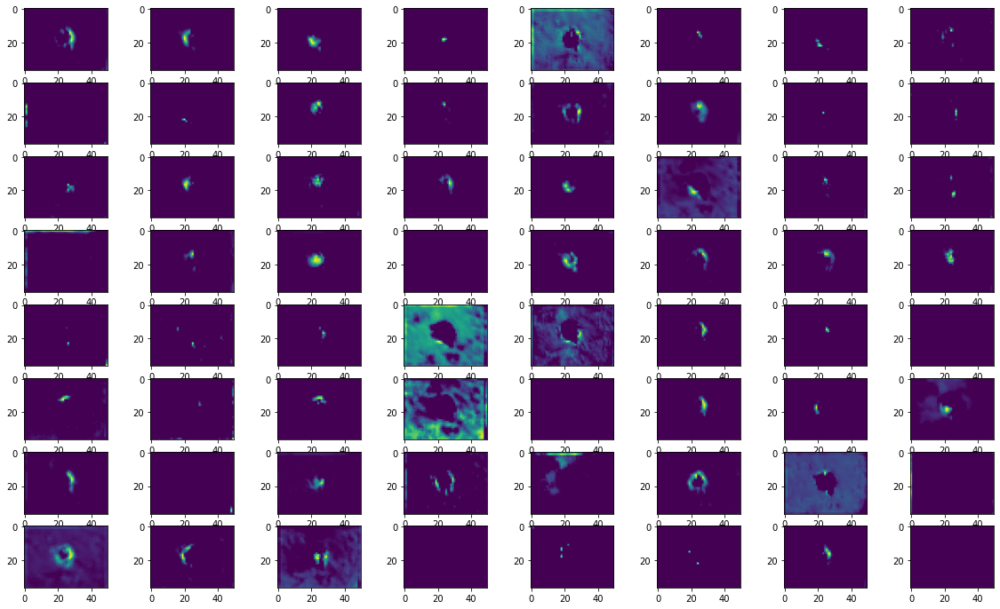

In [54]:
display_activation(activations, 8, 8, 4)

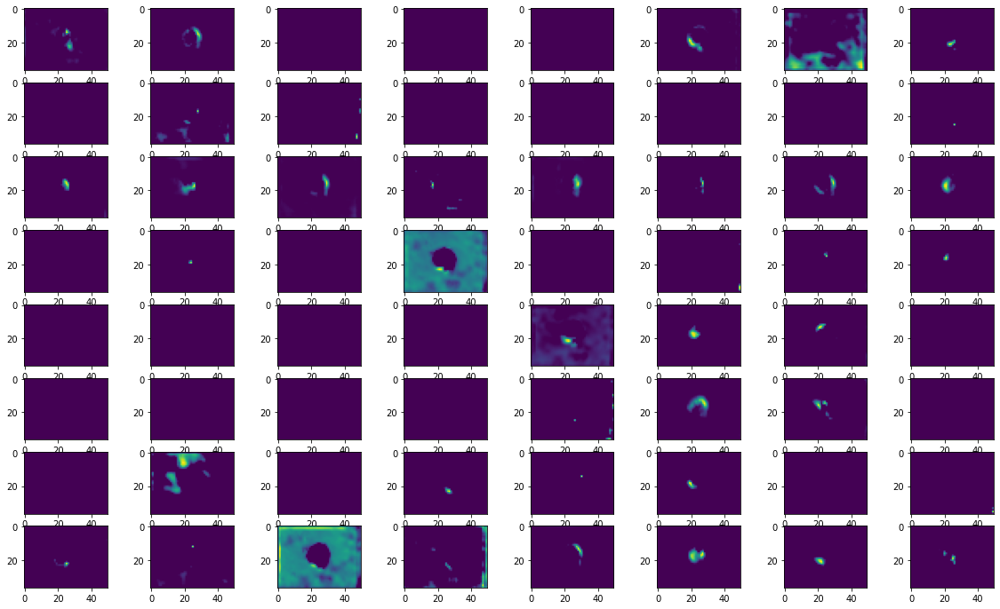

In [55]:
display_activation(activations, 8, 8, 5)

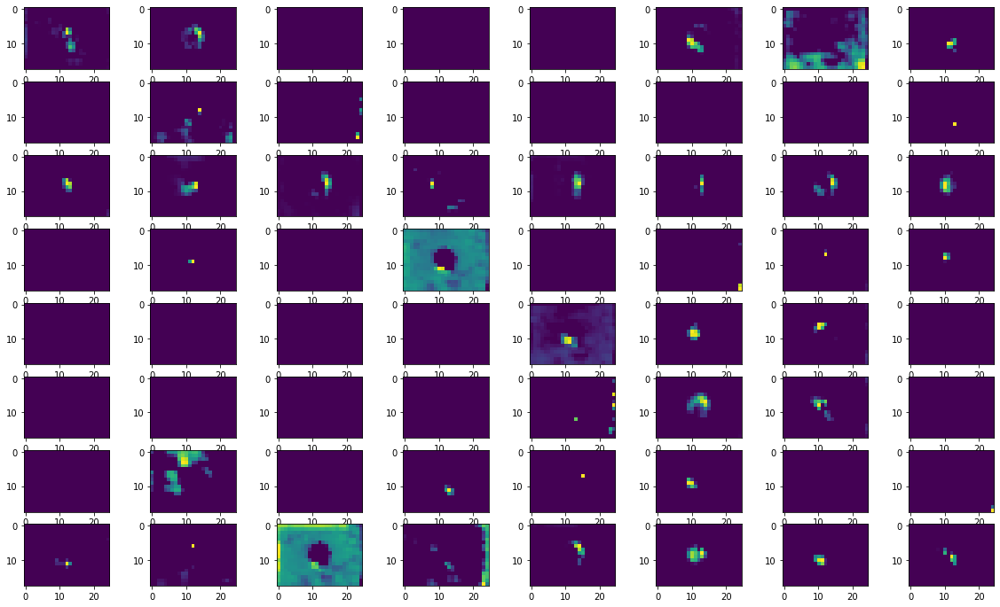

In [56]:
display_activation(activations, 8, 8, 6)

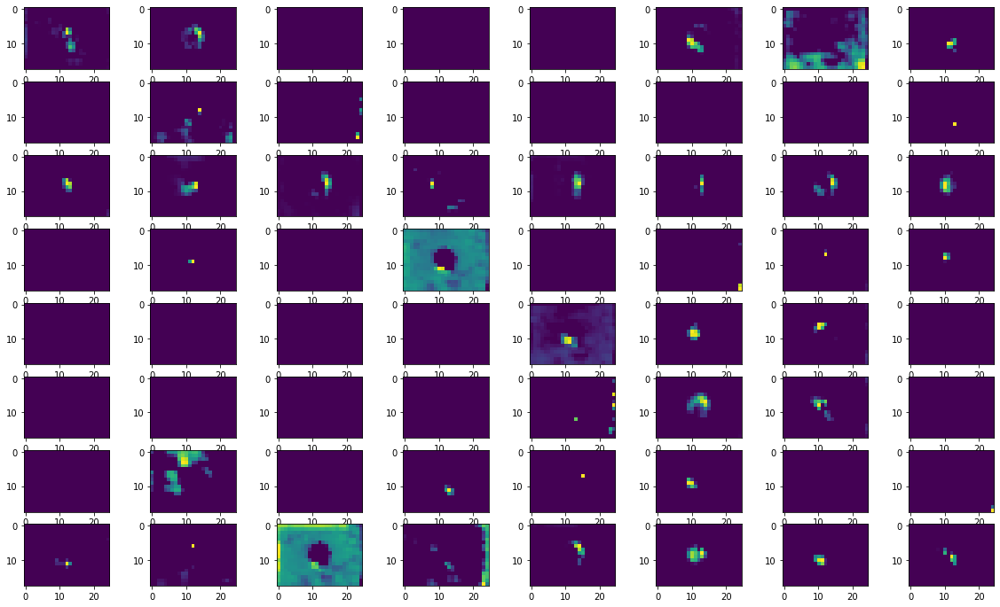

In [57]:
display_activation(activations, 8, 8, 7)

Confusion Matrix

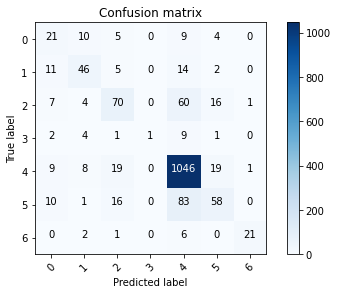

In [58]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Predict the values from the validation dataset
Y_pred = model.predict(x_validate)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(y_validate,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)

 

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(7)) 


#Prediksi terhadap validasi data

In [146]:
predictions = model.predict(x_validate)
predictions

array([[4.52570348e-05, 3.02484364e-06, 1.51964173e-01, ...,
        8.13497961e-01, 3.44870016e-02, 1.15400245e-10],
       [9.89491382e-05, 1.42879807e-03, 6.17385618e-02, ...,
        9.05559421e-01, 2.97032557e-02, 1.12083599e-05],
       [1.94189179e-05, 2.31045942e-06, 6.30224543e-03, ...,
        8.40277433e-01, 1.53398395e-01, 7.46567608e-08],
       ...,
       [7.40591418e-07, 1.12488158e-06, 1.81542225e-02, ...,
        9.79651868e-01, 2.17144703e-03, 3.73304209e-12],
       [1.57302842e-04, 2.82781070e-06, 2.50546029e-03, ...,
        9.95976865e-01, 1.00100785e-03, 2.13978453e-07],
       [1.25213717e-06, 4.25548023e-07, 3.76587245e-03, ...,
        9.22503471e-01, 7.37289712e-02, 1.48929837e-08]], dtype=float32)

In [147]:
for i in range(len(x_validate)):
  pred=str(np.argmax(predictions[i]))
  if pred=='6':
    print(i)

52
212
229
245
259
294
313
377
392
426
507
718
772
834
930
956
1025
1147
1343
1412
1485
1488
1546


In [148]:
def index_pred(ind):
  plt.imshow(x_validate[ind][:,:,0]);

  print()
  pred=str(np.argmax(predictions[ind]))
  # print(pred)

  if pred == '0':
    print("Actinic keratoses")
  elif pred == '1':
    print('Basal cell carcinoma')
  elif pred == '2':
    print('Benign keratosis-like lesions')
  elif pred == '3':
    print('Dermatofibroma')
  elif pred == '4':
    print('Melanocytic nevi')
  elif pred == '5':
    print('melanoma')
  elif pred == '6':
    print('Vascular lesions')


Actinic keratoses


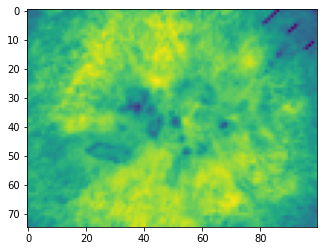

In [149]:
index_pred(53)


Basal cell carcinoma


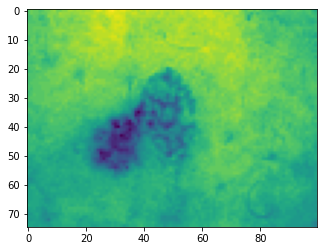

In [150]:
index_pred(297)


Benign keratosis-like lesions


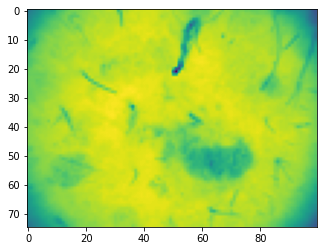

In [151]:
index_pred(935)


Dermatofibroma


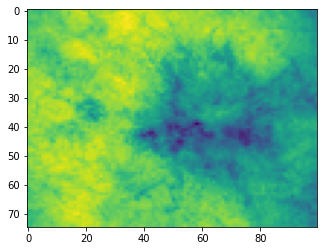

In [152]:
index_pred(159)


Melanocytic nevi


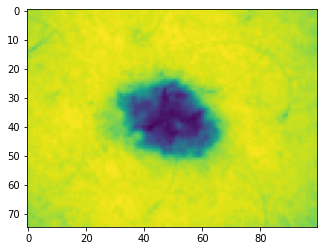

In [153]:
index_pred(1000)


melanoma


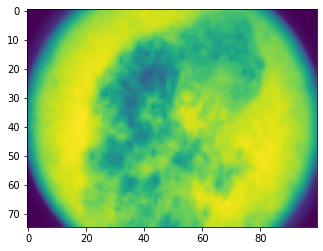

In [154]:
index_pred(1015)


Vascular lesions


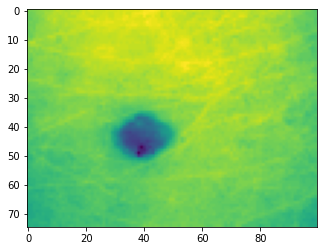

In [184]:
index_pred(212)

#Prediksi terhadap gambar baru

In [156]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [169]:
image_ex = cv.imread('/content/sample.jpg')

image_ex = cv.resize(image_ex, (100, 75))

image_ex = image_ex.astype('float32')

image_ex_mean = np.mean(image_ex)
image_ex_std = np.std(image_ex)
image_ex = (image_ex - image_ex_mean)/image_ex_std

# image_ex = image_ex / 255.0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


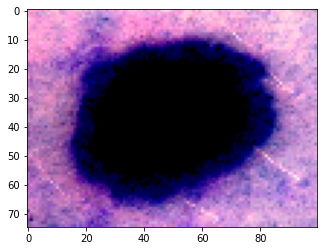

In [170]:
plt.imshow(image_ex)

In [177]:
image_ex.shape

(75, 100, 3)

In [178]:
image_ex = image_ex.reshape((1, 75, 100, 3))

# x_validate = x_validate.reshape(x_validate.shape[0], *(75, 100, 3))

In [179]:
image_ex.shape

(1, 75, 100, 3)

In [180]:
predictions_ex = model.predict(image_ex)
predictions_ex

array([[4.0552736e-10, 1.6871412e-06, 6.4189924e-04, 1.9522543e-10,
        3.3710602e-01, 1.1947224e-01, 5.4277813e-01]], dtype=float32)

In [182]:
str(np.argmax(predictions_ex[0]))

'6'

In [183]:
if pred_ex == '0':
  print("Actinic keratoses")
elif pred_ex == '1':
  print('Basal cell carcinoma')
elif pred_ex == '2':
  print('Benign keratosis-like lesions')
elif pred_ex == '3':
  print('Dermatofibroma')
elif pred_ex == '4':
  print('Melanocytic nevi')
elif pred_ex == '5':
  print('melanoma')
elif pred_ex == '6':
  print('Vascular lesions')

Vascular lesions
